# Wasserstein GAN with Gradient Penalty
## For generation of features based on LHCO2020 datasets

In [1]:
import h5py as h5
import numpy as np
from math import ceil, floor, isnan
import random
from tqdm import tqdm
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras import layers
import keras.backend as K
import gc
print(tf.__version__)
physical_devices = tf.config.experimental.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(physical_devices[0], True)
print(physical_devices[0])

tf.random.set_seed(1234)

Using TensorFlow backend.
2.1.0
PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


In [2]:
filenames = {
    "herwig": "GAN-data\events_anomalydetection_DelphesHerwig_qcd_features.h5",
    "pythiabg": "GAN-data\events_anomalydetection_DelphesPythia8_v2_qcd_features.h5",
    "pythiasig": "GAN-data\events_anomalydetection_DelphesPythia8_v2_Wprime_features.h5"
}

datatypes = ["herwig", "pythiabg", "pythiasig"]
features = ["px", "py", "pz", "m", "tau1", "tau2", "tau3"]

train_features = ["mj2", "mjdelta", "tau21j1", "tau21j2"] # Can be flexibly changed to suit GAN needs

In [3]:
def load_data(datatype, stop = None):
    input_frame = pd.read_hdf(filenames[datatype], stop = stop)
    output_frame = input_frame.copy()
    for feature in features:
        output_frame[feature + "j1"] = (input_frame["mj1"] >= input_frame["mj2"])*input_frame[feature + "j1"] + (input_frame["mj1"] < input_frame["mj2"])*input_frame[feature + "j2"]
        output_frame[feature + "j2"] = (input_frame["mj1"] >= input_frame["mj2"])*input_frame[feature + "j2"] + (input_frame["mj1"] < input_frame["mj2"])*input_frame[feature + "j1"]
    del input_frame
    gc.collect()
    output_frame["mjdelta"] = output_frame["mj1"] - output_frame["mj2"]
    output_frame["ej1"] = np.sqrt(output_frame["mj1"]**2 + output_frame["pxj1"]**2 + output_frame["pyj1"]**2 + output_frame["pzj1"]**2)
    output_frame["ej2"] = np.sqrt(output_frame["mj2"]**2 + output_frame["pxj2"]**2 + output_frame["pyj2"]**2 + output_frame["pzj2"]**2)
    output_frame["ejj"] = output_frame["ej1"] + output_frame["ej2"]
    output_frame["pjj"] = np.sqrt((output_frame["pxj1"] + output_frame["pxj2"])**2 + (output_frame["pyj1"] + output_frame["pyj2"])**2 + (output_frame["pzj1"] + output_frame["pzj2"])**2)
    output_frame["mjj"] = np.sqrt(output_frame["ejj"]**2 - output_frame["pjj"]**2)
    output_frame["tau21j1"] = output_frame["tau2j1"] / output_frame["tau1j1"]
    output_frame["tau32j1"] = output_frame["tau3j1"] / output_frame["tau2j1"]
    output_frame["tau21j2"] = output_frame["tau2j2"] / output_frame["tau1j2"]
    output_frame["tau32j2"] = output_frame["tau3j2"] / output_frame["tau2j2"]
    return output_frame

In [4]:
# Network hyperparameters
BATCH_SIZE = 256
EPOCHS = 500 # 1000 epochs takes >~ 3 hours on GTX 1660

# Adam hyperparameters as recommended by arXiv:1704.00028
LEARNING_RATE = 1e-4
BETA_1 = 0
BETA_2 = 0.9

# WGAN hyperparameters
N_CRITIC = 5
C_LAMBDA = 10

In [5]:
df = load_data("herwig")

# Ensures all batches have same size

df.dropna(inplace = True)
df.drop([i for i in range(df.shape[0] % (BATCH_SIZE * 4))], inplace = True)
df.reset_index(drop = True, inplace = True)
df = df.astype('float32')

In [6]:
# Normalize all inputs between -1 and 1

scaler = MinMaxScaler((-1,1)).fit(df[train_features])
feature_df = scaler.transform(df[train_features])

X_train, X_test = train_test_split(feature_df, test_size = 0.25, random_state = 1234)
len_dataset = int(X_train.shape[0] / BATCH_SIZE)
len_testset = int(X_test.shape[0] / BATCH_SIZE)
print("Dataset consists of {} batches of {} samples each, total {} samples".format(len_dataset, BATCH_SIZE, len_dataset * BATCH_SIZE))
print("Testset consists of {} batches of {} samples each, total {} samples".format(len_testset, BATCH_SIZE, len_testset * BATCH_SIZE))

del df
gc.collect()

Dataset consists of 2928 batches of 256 samples each, total 749568 samples
Testset consists of 976 batches of 256 samples each, total 249856 samples


0

In [7]:
train_dataset = tf.data.Dataset.from_tensor_slices(np.array(X_train)).batch(BATCH_SIZE)
test_dataset = tf.data.Dataset.from_tensor_slices(np.array(X_test)).batch(BATCH_SIZE)

In [8]:
def make_generator_model():
    model = tf.keras.Sequential()
    model.add(layers.Dense(50, input_shape=(len(train_features),)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.5))

    model.add(layers.Dense(50))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.5))

    model.add(layers.Dense(50))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.5))

    model.add(layers.Dense(len(train_features), activation='tanh'))
    assert model.output_shape == (None, len(train_features))

    return model

In [9]:
generator = make_generator_model()

In [10]:
def make_discriminator_model():
    model = tf.keras.Sequential()
    model.add(layers.Dense(50, input_shape=(len(train_features),)))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Dense(50))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Dense(1)) # WGAN: No sigmoid activation in last layer

    return model

In [11]:
discriminator = make_discriminator_model()

In [12]:
generator.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 50)                250       
_________________________________________________________________
batch_normalization (BatchNo (None, 50)                200       
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 50)                0         
_________________________________________________________________
dropout (Dropout)            (None, 50)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 50)                2550      
_________________________________________________________________
batch_normalization_1 (Batch (None, 50)                200       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 50)                0

In [13]:
discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_4 (Dense)              (None, 50)                250       
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 50)                0         
_________________________________________________________________
dropout_3 (Dropout)          (None, 50)                0         
_________________________________________________________________
dense_5 (Dense)              (None, 50)                2550      
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 50)                0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 50)                0         
_________________________________________________________________
dense_6 (Dense)              (None, 1)                

In [14]:
@tf.function
def gradient_penalty(real, fake, epsilon): 
    # mixed_images = real * epsilon + fake * (1 - epsilon)
    mixed_images = fake + epsilon * (real - fake)
    with tf.GradientTape() as tape:
        tape.watch(mixed_images) 
        mixed_scores = discriminator(mixed_images)
        
    gradient = tape.gradient(mixed_scores, mixed_images)[0]
    
    gradient_norm = tf.norm(gradient)
    penalty = tf.math.reduce_mean((gradient_norm - 1)**2)
    return penalty

In [15]:
@tf.function
def discriminator_loss(real_output, fake_output, gradient_penalty):
    loss = tf.math.reduce_mean(fake_output) - tf.math.reduce_mean(real_output) + C_LAMBDA * gradient_penalty
    return loss

In [16]:
@tf.function
def generator_loss(fake_output):
    gen_loss = -1. * tf.math.reduce_mean(fake_output)
    return gen_loss

In [17]:
generator_optimizer = tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE, beta_1=BETA_1, beta_2=BETA_2)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE, beta_1=BETA_1, beta_2=BETA_2)

In [18]:
# Convert tensor to float for loss function plotting
def K_eval(x):
    try:
        return K.get_value(K.to_dense(x))
    except:
        eval_fn = K.function([], [x])
        return eval_fn([])[0]

In [19]:
@tf.function
def train_step_generator():
  noise = tf.random.normal([BATCH_SIZE, len(train_features)])

  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    generated_images = generator(noise, training=True)
    fake_output = discriminator(generated_images, training=True)
    gen_loss = generator_loss(fake_output)

  gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)

  generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
  
  return gen_loss

In [20]:
@tf.function
def train_step_discriminator(images):
  noise = tf.random.normal([BATCH_SIZE, len(train_features)])

  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    generated_images = generator(noise, training=True)

    real_output = discriminator(images, training=True)
    fake_output = discriminator(generated_images, training=True)

    epsilon = tf.random.normal([BATCH_SIZE,len(train_features)])
    gp = gradient_penalty(images, generated_images, epsilon)
    
    disc_loss = discriminator_loss(real_output, fake_output, gp)

  gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

  discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
  
  return disc_loss

In [21]:
@tf.function
def evaluate_generator():
    noise = tf.random.normal([BATCH_SIZE, len(train_features)])
    generated_images = generator(noise, training=False)

    fake_output = discriminator(generated_images, training=False)

    gen_loss = generator_loss(fake_output)

    return gen_loss

In [22]:
@tf.function
def evaluate_discriminator(images):
    noise = tf.random.normal([BATCH_SIZE, len(train_features)])
    generated_images = generator(noise, training=False)

    real_output = discriminator(images, training=False)
    fake_output = discriminator(generated_images, training=False)

    epsilon = tf.random.normal([BATCH_SIZE,len(train_features)])
    gp = gradient_penalty(images, generated_images, epsilon)
    
    disc_loss = discriminator_loss(real_output, fake_output, gp)

    return disc_loss

In [23]:
def graph_gan(generator):
    realdata = scaler.inverse_transform(X_train)
    fakedata = scaler.inverse_transform(generator(tf.random.normal((10000, len(train_features))), training=False))
    
    plt.title("Subleading Jet Mass")
    plt.ylabel("Normalized to Unity")
    plt.xlabel("$m_{J_2}$")
    plt.hist(realdata[:,0], bins = 25, range = (0, 600), color = "tab:orange", alpha = 0.5, label = "Herwig Background", density = True)
    plt.hist(fakedata[:,0], bins = 25, range = (0, 600), color = "tab:blue", histtype = "step", label = "GAN", density = True)
    plt.legend()
    plt.show()

    plt.title("Leading-Subleading Jet Mass Delta")
    plt.ylabel("Normalized to Unity")
    plt.xlabel("$m_{J_1}-m_{J_2}$")
    plt.hist(realdata[:,1], bins = 25, range = (0, 600), color = "tab:orange", alpha = 0.5, label = "Herwig Background", density = True)
    plt.hist(fakedata[:,1], bins = 25, range = (0, 600), color = "tab:blue", histtype = "step", label = "GAN", density = True)
    plt.legend()
    plt.show()

    plt.title("N-subjettiness ratio")
    plt.ylabel("Normalized to Unity")
    plt.xlabel("$\\tau_{21J_1}$")
    plt.hist(realdata[:,2], bins = 25, range = (0, 1), color = "tab:orange", alpha = 0.5, label = "Herwig Background", density = True)
    plt.hist(fakedata[:,2], bins = 25, range = (0, 1), color = "tab:blue", histtype = "step", label = "GAN", density = True)
    plt.legend()
    plt.show()
    
    plt.title("N-subjettiness ratio")
    plt.ylabel("Normalized to Unity")
    plt.xlabel("$\\tau_{21J_2}$")
    plt.hist(realdata[:,3], bins = 25, range = (0, 1), color = "tab:orange", alpha = 0.5, label = "Herwig Background", density = True)
    plt.hist(fakedata[:,3], bins = 25, range = (0, 1), color = "tab:blue", histtype = "step", label = "GAN", density = True)
    plt.legend()
    plt.show()

In [24]:
train_gen_losses = []
train_disc_losses = []
test_gen_losses = []
test_disc_losses = []

In [25]:
def graph_genloss():
    plt.title("Generator Loss")
    plt.ylabel("Wasserstein Loss")
    plt.xlabel("Epoch")
    plt.plot(train_gen_losses, 'b', label = "Training loss")
    plt.plot(test_gen_losses, 'r', label = "Validation loss")
    plt.legend()
    plt.show()

In [26]:
def graph_discloss():
    plt.title("Discriminator Loss")
    plt.ylabel("Wasserstein Loss")
    plt.xlabel("Epoch")
    plt.plot(train_disc_losses, 'b', label = "Training loss")
    plt.plot(test_disc_losses, 'r', label = "Validation loss")
    plt.legend()
    plt.show()

In [27]:
def train(dataset, testset, epochs, n_critic):
  for epoch in tqdm(range(epochs)):
    print_losses = ((epoch + 1) % 10 == 0)
    draw_outputs = ((epoch + 1) % 20 == 0)

    train_gen_loss = 0
    train_disc_loss = 0

    test_gen_loss = 0
    test_disc_loss = 0

    # Training

    for batchnum, image_batch in enumerate(dataset):
      if random.random() < 1 / n_critic:
        train_gen_loss += K_eval(train_step_generator()) / len_dataset * n_critic
      train_disc_loss += K_eval(train_step_discriminator(image_batch)) / len_dataset
    
    train_gen_losses.append(train_gen_loss)
    train_disc_losses.append(train_disc_loss)

    # Evaluation

    for batchnum, test_batch in enumerate(testset):
      test_gen_loss += K_eval(evaluate_generator()) / len_testset
      test_disc_loss += K_eval(evaluate_discriminator(test_batch)) / len_testset

    test_gen_losses.append(test_gen_loss)
    test_disc_losses.append(test_disc_loss)

    # Logging

    if print_losses:
      print()
      print("Epoch " + str(epoch + 1) + ":")
      print()
      print("Generator training loss: " + str(train_gen_losses[-1]))
      print("Discriminator training loss: " + str(train_disc_losses[-1]))
      print()
      print("Generator validation loss: " + str(test_gen_losses[-1]))
      print("Discriminator validation loss: " + str(test_disc_losses[-1]))

    if draw_outputs:
      print()
      print("Epoch " + str(epoch + 1) + ":")
      graph_gan(generator)
      graph_genloss()
      graph_discloss()

  2%|▏         | 10/500 [01:45<1:23:30, 10.22s/it]
Epoch 10:

Generator training loss: -1.8685601521385178
Discriminator training loss: 0.16875418301973008

Generator validation loss: -1.7417844493613874
Discriminator validation loss: 0.20600271422690766
  4%|▍         | 19/500 [03:16<1:21:19, 10.15s/it]
Epoch 20:

Generator training loss: -0.8037202508580652
Discriminator training loss: 0.12587481796033848

Generator validation loss: -1.29501902947172
Discriminator validation loss: 0.2593276699409498

Epoch 20:


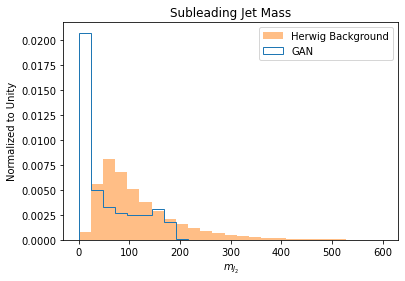

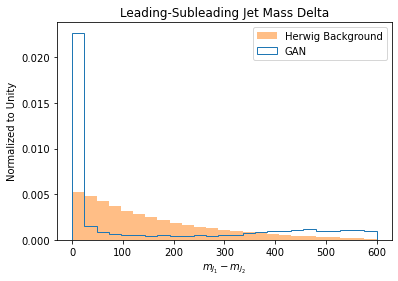

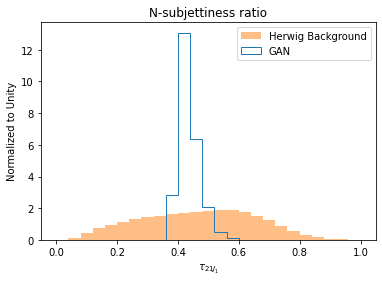

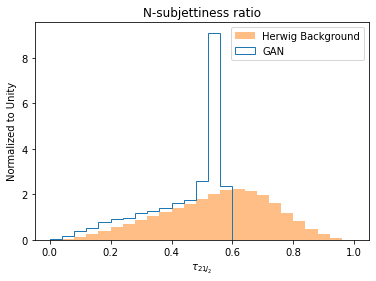

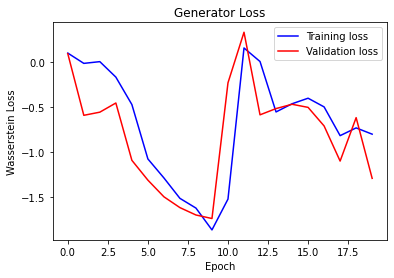

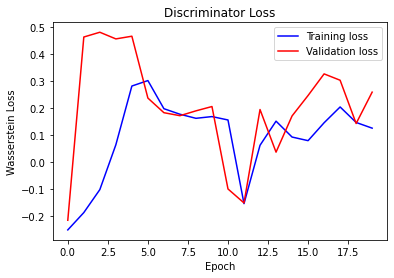

  6%|▌         | 30/500 [05:38<1:42:09, 13.04s/it]
Epoch 30:

Generator training loss: -0.1326085517241868
Discriminator training loss: 0.012036242993069674

Generator validation loss: -0.5292205699398871
Discriminator validation loss: 0.2549514283853599
  8%|▊         | 39/500 [07:33<1:40:46, 13.12s/it]
Epoch 40:

Generator training loss: -0.6254521177705031
Discriminator training loss: 0.3175412672800067

Generator validation loss: -0.6147670358663696
Discriminator validation loss: 0.07159665266632051

Epoch 40:


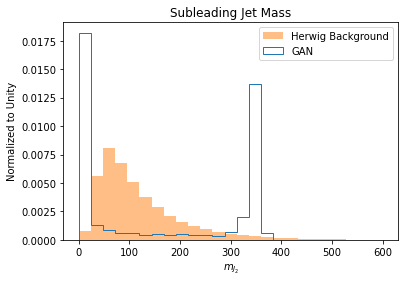

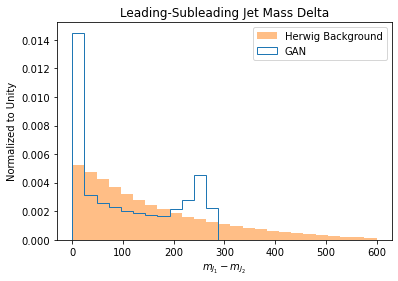

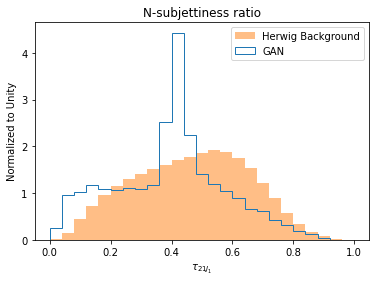

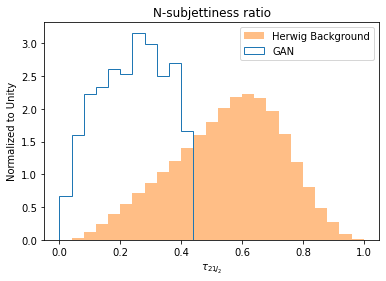

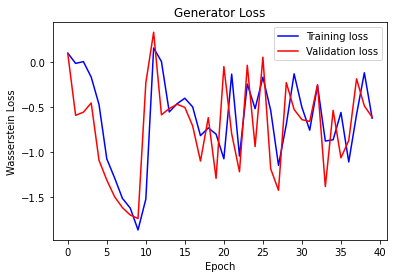

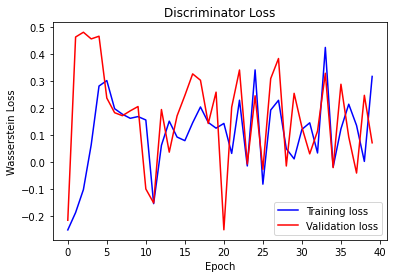

 10%|█         | 50/500 [10:08<1:42:05, 13.61s/it]
Epoch 50:

Generator training loss: -0.4251455370072134
Discriminator training loss: 0.23364135115061685

Generator validation loss: -1.0574759582027053
Discriminator validation loss: 0.48383652000520067
 12%|█▏        | 59/500 [12:04<1:28:30, 12.04s/it]
Epoch 60:

Generator training loss: 0.25790828876222777
Discriminator training loss: 0.06292921974555038

Generator validation loss: 0.28560243821779213
Discriminator validation loss: 0.06273523865260007

Epoch 60:


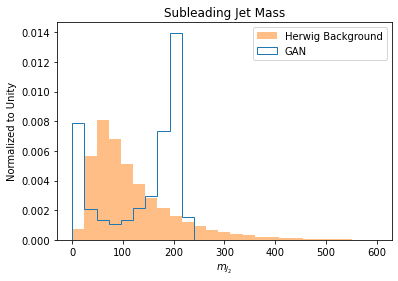

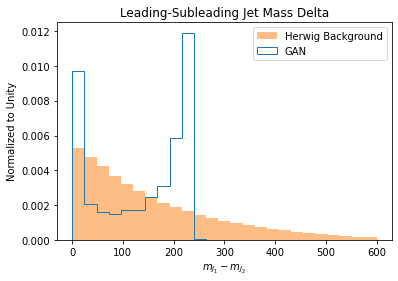

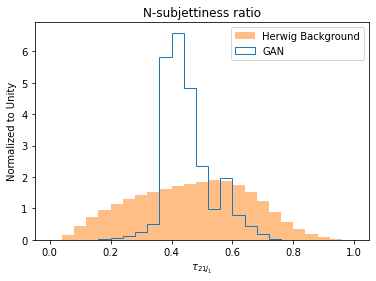

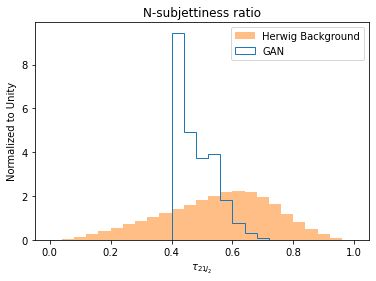

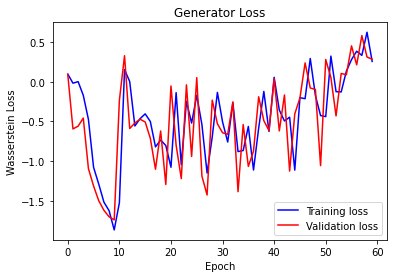

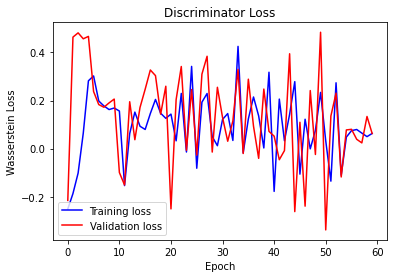

 14%|█▍        | 70/500 [14:02<1:15:47, 10.57s/it]
Epoch 70:

Generator training loss: 1.3329640326034178
Discriminator training loss: 0.027026470485445125

Generator validation loss: 1.2355814561492093
Discriminator validation loss: 0.050381359155671566
 16%|█▌        | 79/500 [15:36<1:12:52, 10.39s/it]
Epoch 80:

Generator training loss: 1.5596419289870984
Discriminator training loss: 0.015695149887863826

Generator validation loss: 1.5342829363023636
Discriminator validation loss: 0.02672028370186324

Epoch 80:


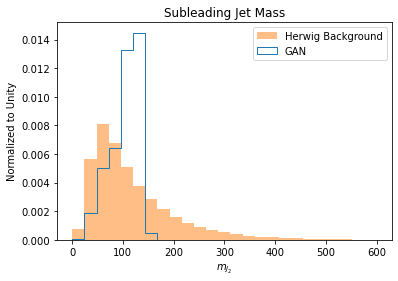

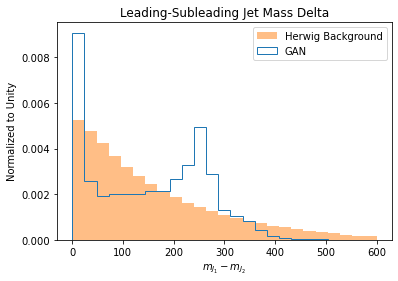

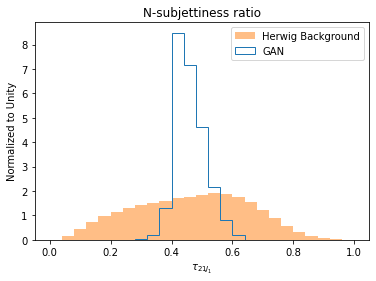

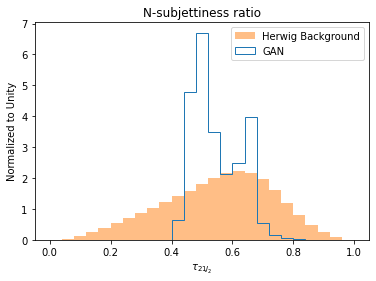

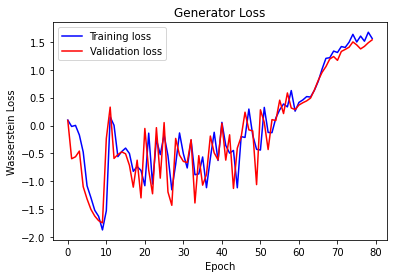

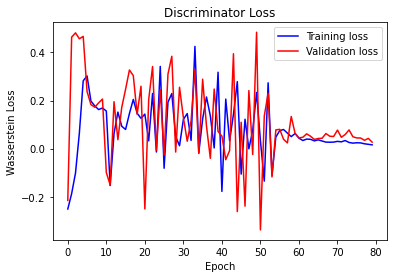

 18%|█▊        | 90/500 [17:35<1:11:49, 10.51s/it]
Epoch 90:

Generator training loss: 1.8507990428333059
Discriminator training loss: 0.014849631052696127

Generator validation loss: 1.6718741464810287
Discriminator validation loss: 0.017561197983729362
 20%|█▉        | 99/500 [19:13<1:11:00, 10.63s/it]
Epoch 100:

Generator training loss: 2.3005174397607964
Discriminator training loss: 0.013007710315340794

Generator validation loss: 1.9357527822988927
Discriminator validation loss: 0.006758873593121573

Epoch 100:


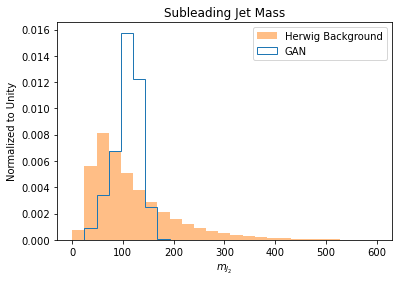

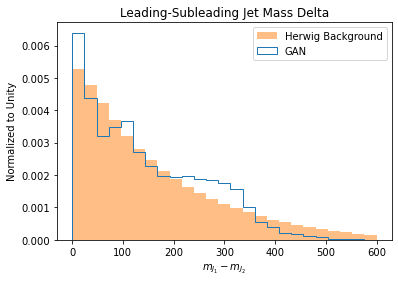

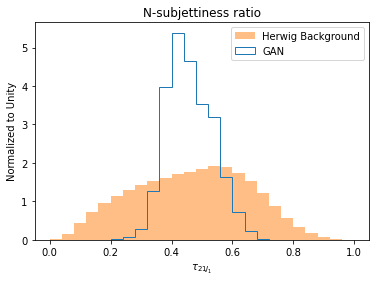

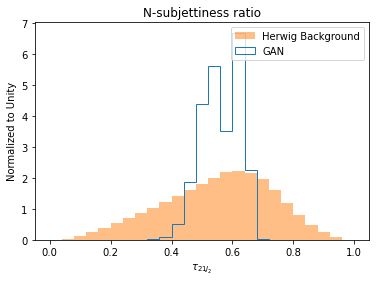

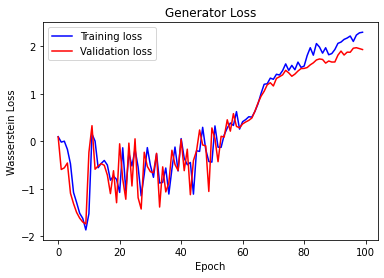

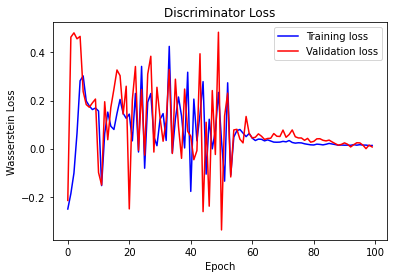

 22%|██▏       | 110/500 [21:13<1:10:01, 10.77s/it]
Epoch 110:

Generator training loss: 2.53662472702766
Discriminator training loss: 0.01216460714758646

Generator validation loss: 2.174571811664298
Discriminator validation loss: 0.011557204819829912
 24%|██▍       | 119/500 [22:48<1:07:14, 10.59s/it]
Epoch 120:

Generator training loss: 2.4656102484692646
Discriminator training loss: 0.0083176256082412

Generator validation loss: 2.292509769807098
Discriminator validation loss: 0.006838414975517786

Epoch 120:


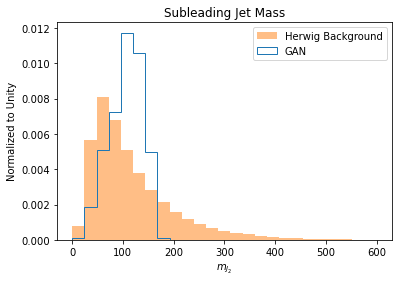

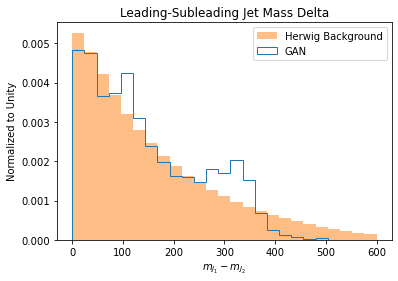

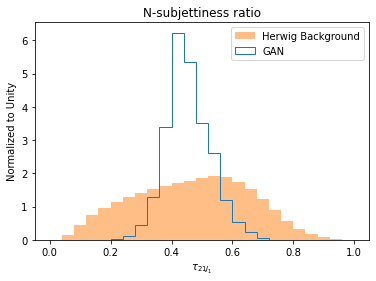

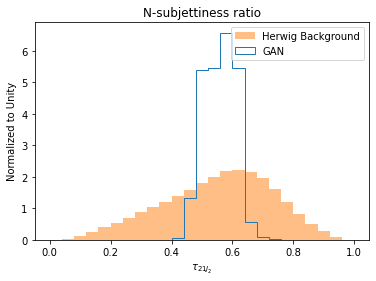

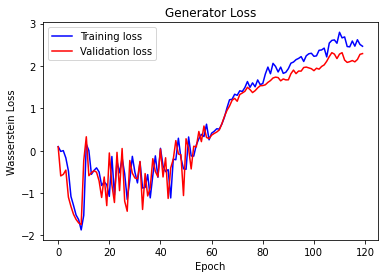

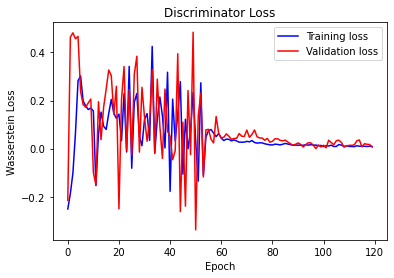

 26%|██▌       | 130/500 [24:46<1:05:16, 10.58s/it]
Epoch 130:

Generator training loss: 2.407238262761484
Discriminator training loss: 0.0074136113719914

Generator validation loss: 1.9873132628739854
Discriminator validation loss: 0.03372969703851881
 28%|██▊       | 139/500 [26:22<1:03:47, 10.60s/it]
Epoch 140:

Generator training loss: 2.2532259192460207
Discriminator training loss: 0.011813973791484531

Generator validation loss: 1.9189198968596133
Discriminator validation loss: 0.057079663618513556

Epoch 140:


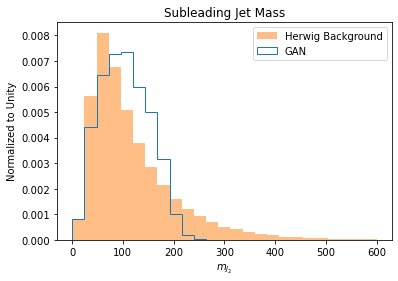

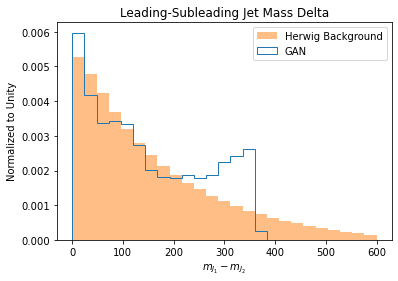

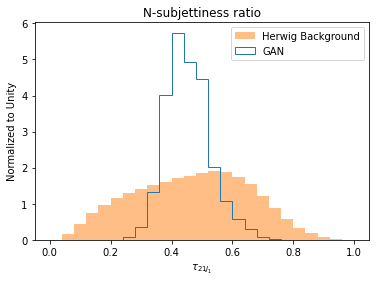

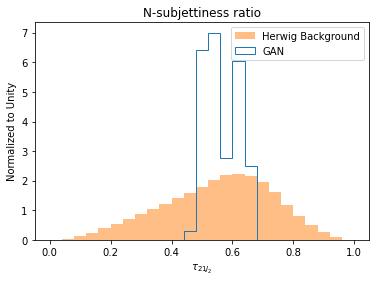

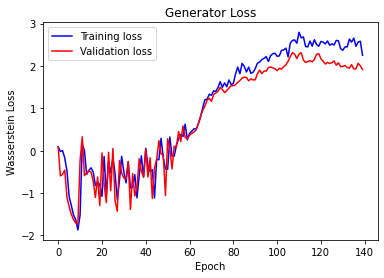

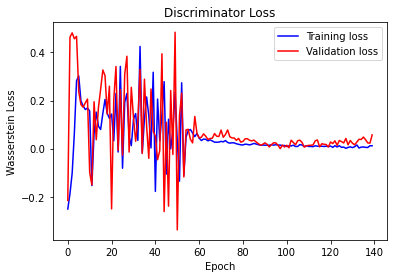

 30%|███       | 150/500 [28:20<1:01:01, 10.46s/it]
Epoch 150:

Generator training loss: 2.3380262856600704
Discriminator training loss: 0.02581407012592812

Generator validation loss: 1.868632130935545
Discriminator validation loss: 0.04272489594276533
 32%|███▏      | 159/500 [29:55<59:17, 10.43s/it]  
Epoch 160:

Generator training loss: 2.2730534733400316
Discriminator training loss: 0.01814085059089219

Generator validation loss: 1.5701779925920931
Discriminator validation loss: 0.07116496656471703

Epoch 160:


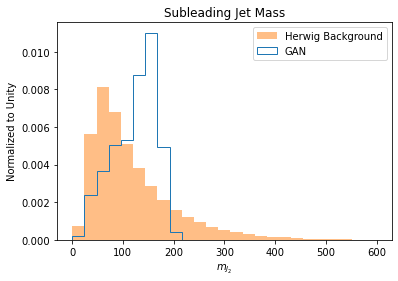

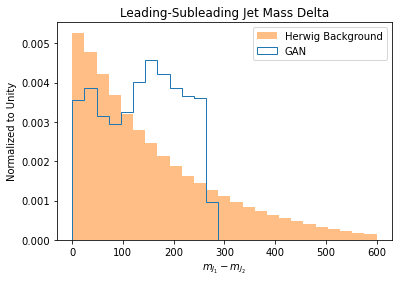

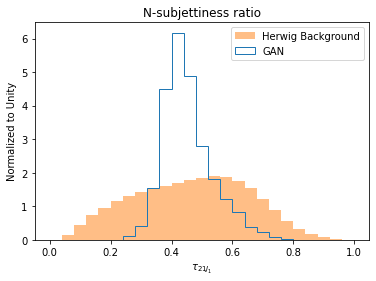

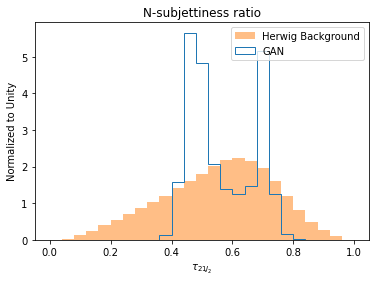

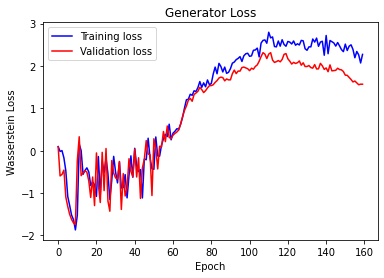

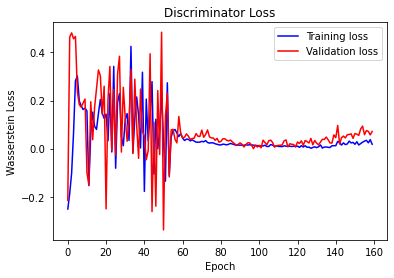

 34%|███▍      | 170/500 [31:53<58:07, 10.57s/it]
Epoch 170:

Generator training loss: 2.209594817679438
Discriminator training loss: 0.010221834849369251

Generator validation loss: 1.4774021295006179
Discriminator validation loss: 0.057535088792840264
 36%|███▌      | 179/500 [33:29<56:40, 10.59s/it]
Epoch 180:

Generator training loss: 1.745299064640789
Discriminator training loss: 0.0010792625723814386

Generator validation loss: 1.0436672565878409
Discriminator validation loss: 0.06931742389121497

Epoch 180:


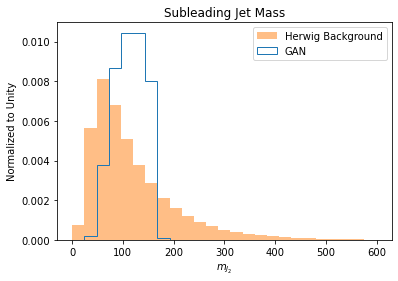

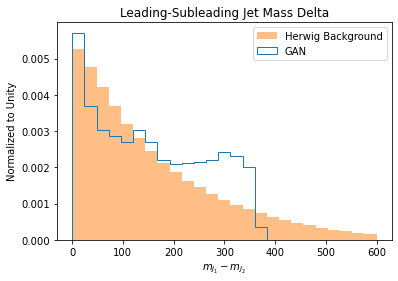

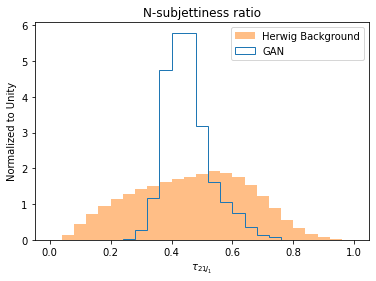

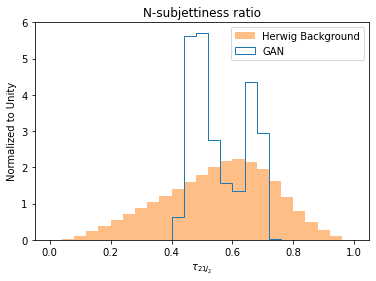

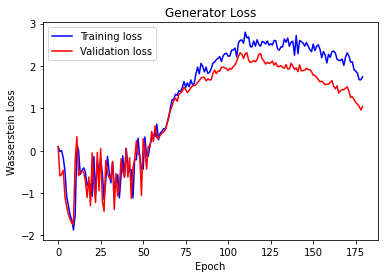

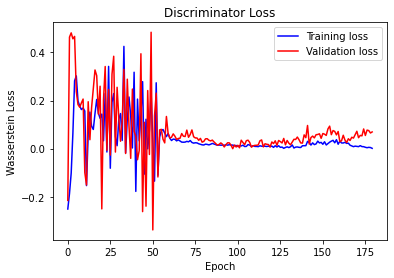

 38%|███▊      | 190/500 [35:27<54:21, 10.52s/it]
Epoch 190:

Generator training loss: 1.9548842485973748
Discriminator training loss: 0.0072225245850928675

Generator validation loss: 1.2758218920866022
Discriminator validation loss: 0.07144951207761761
 40%|███▉      | 199/500 [37:02<52:25, 10.45s/it]
Epoch 200:

Generator training loss: 2.0093866036645056
Discriminator training loss: 0.006395791857106847

Generator validation loss: 1.167324221402893
Discriminator validation loss: 0.0867675963033479

Epoch 200:


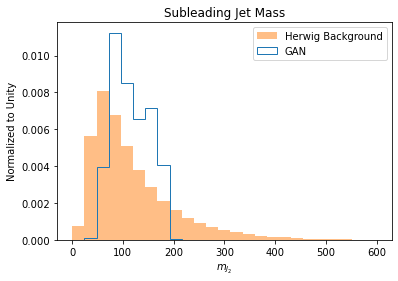

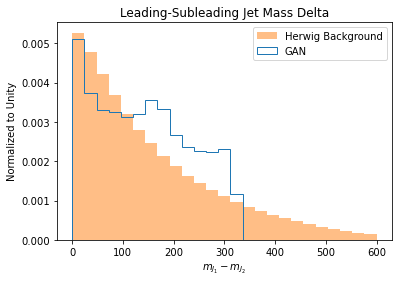

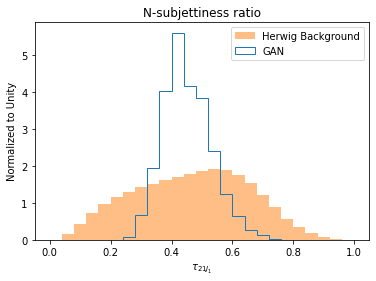

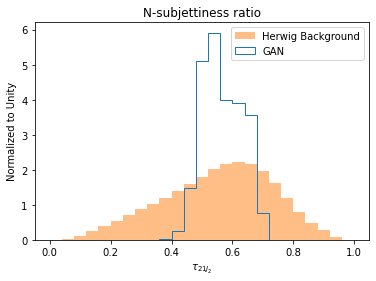

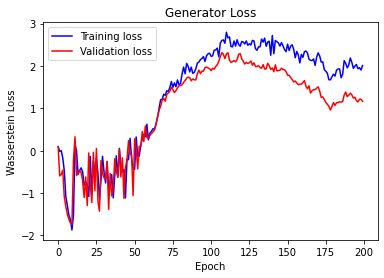

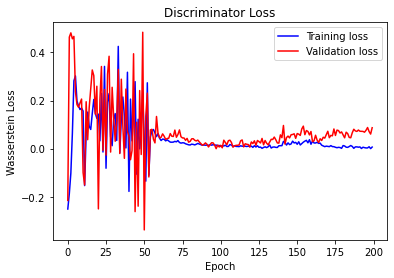

 42%|████▏     | 210/500 [38:58<50:42, 10.49s/it]
Epoch 210:

Generator training loss: 1.7172544186965386
Discriminator training loss: 0.01175336839042148

Generator validation loss: 0.9093547772432933
Discriminator validation loss: 0.05658542694233843
 44%|████▍     | 219/500 [40:33<49:46, 10.63s/it]
Epoch 220:

Generator training loss: 1.4274778578410057
Discriminator training loss: 0.006519377970624472

Generator validation loss: 0.5950467660412433
Discriminator validation loss: 0.06509496348711552

Epoch 220:


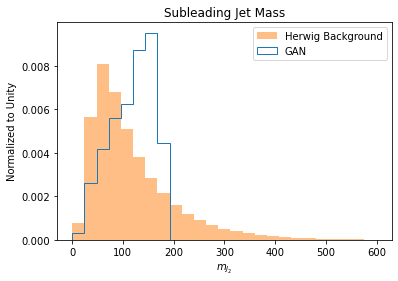

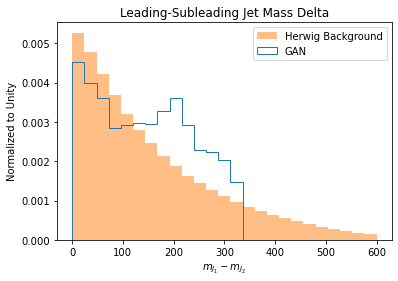

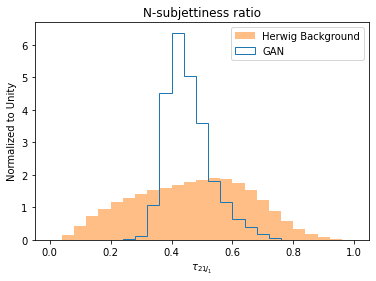

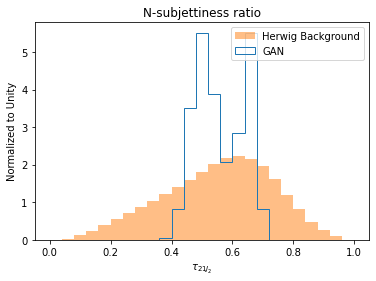

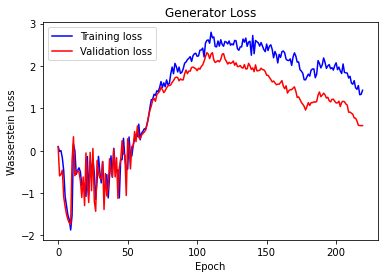

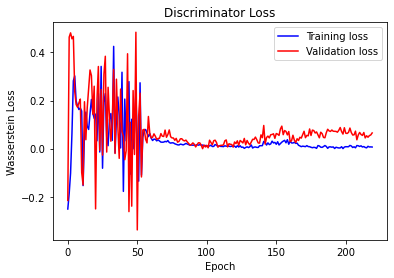

 46%|████▌     | 230/500 [42:30<46:06, 10.25s/it]
Epoch 230:

Generator training loss: 1.6313531213119383
Discriminator training loss: -0.0015353400258937711

Generator validation loss: 0.8338687793031087
Discriminator validation loss: 0.05602899887293704
 48%|████▊     | 239/500 [44:00<43:27,  9.99s/it]
Epoch 240:

Generator training loss: 1.4789180034171034
Discriminator training loss: 0.012854917773577694

Generator validation loss: 0.5207212591757541
Discriminator validation loss: 0.05853521697162113

Epoch 240:


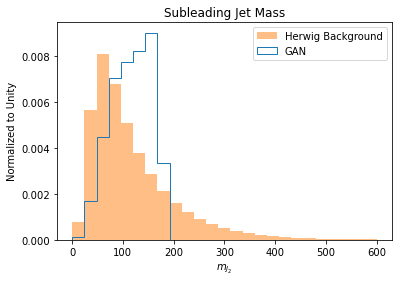

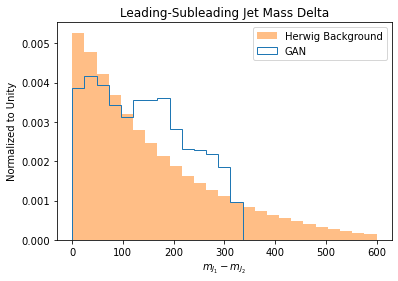

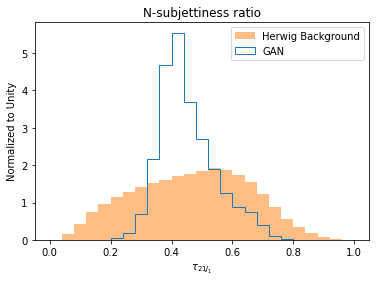

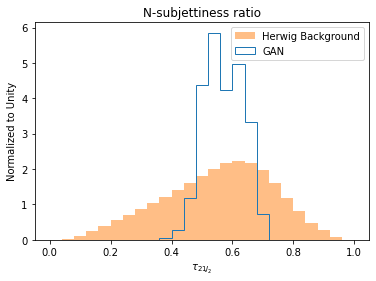

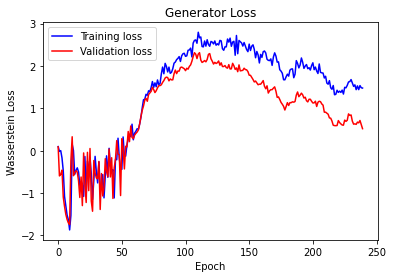

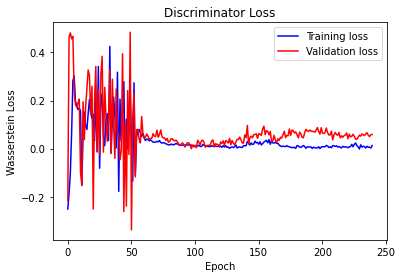

 50%|█████     | 250/500 [46:06<52:04, 12.50s/it]
Epoch 250:

Generator training loss: 1.1570930888092585
Discriminator training loss: 0.008974831410386457

Generator validation loss: 0.15448206539464285
Discriminator validation loss: 0.053498199778288395
 52%|█████▏    | 259/500 [47:43<43:21, 10.79s/it]
Epoch 260:

Generator training loss: 0.8467303278545523
Discriminator training loss: 0.008320472618908706

Generator validation loss: 0.012869232717556037
Discriminator validation loss: 0.05378158832709379

Epoch 260:


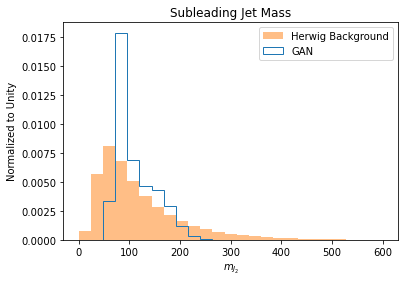

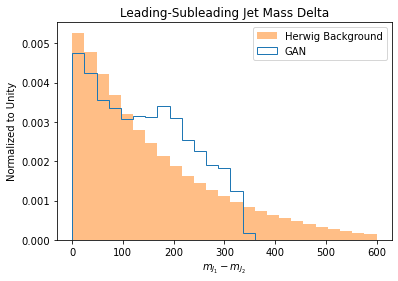

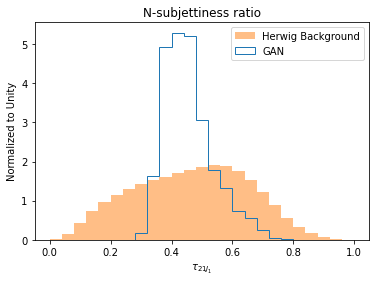

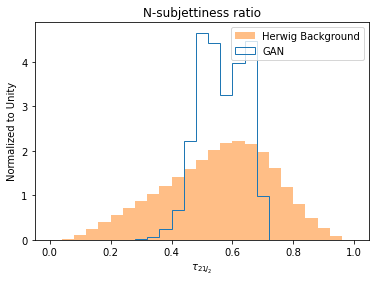

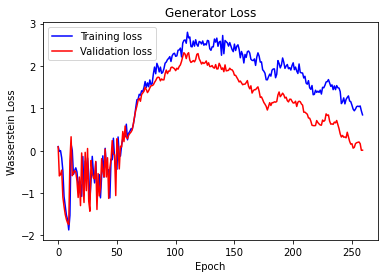

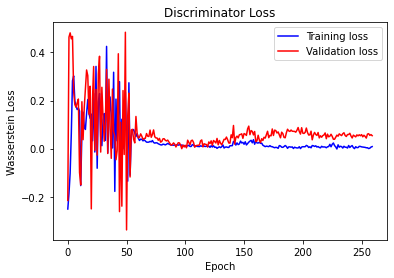

 54%|█████▍    | 270/500 [49:43<41:08, 10.73s/it]
Epoch 270:

Generator training loss: 0.776069859281956
Discriminator training loss: 0.010218525493973831

Generator validation loss: -0.06606810281557021
Discriminator validation loss: 0.04840938915445116
 56%|█████▌    | 279/500 [51:20<39:08, 10.63s/it]
Epoch 280:

Generator training loss: 0.7383894689299704
Discriminator training loss: 0.009160367374842113

Generator validation loss: -0.11208964911762802
Discriminator validation loss: 0.039741334309763274

Epoch 280:


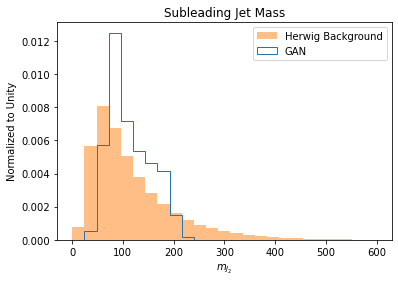

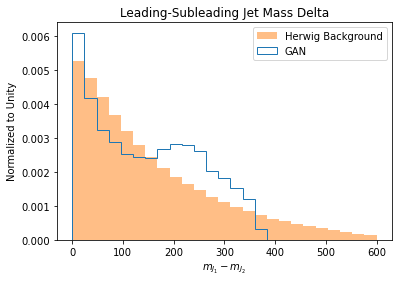

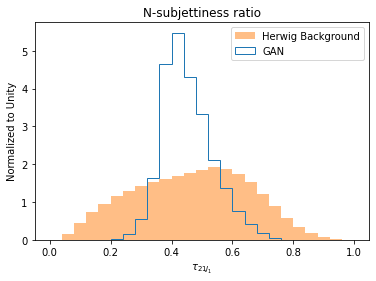

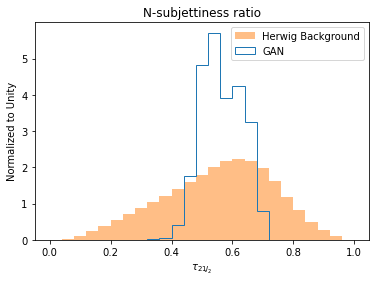

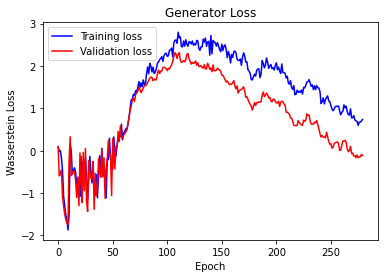

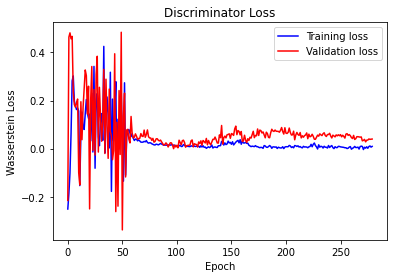

 58%|█████▊    | 290/500 [53:23<40:26, 11.55s/it]
Epoch 290:

Generator training loss: 0.4434963628329095
Discriminator training loss: 0.005969290532328921

Generator validation loss: -0.4638009990458606
Discriminator validation loss: 0.056694948362553024
 60%|█████▉    | 299/500 [55:00<36:15, 10.82s/it]
Epoch 300:

Generator training loss: 0.5042442170803848
Discriminator training loss: 0.003978581348294694

Generator validation loss: -0.27130453859562775
Discriminator validation loss: 0.033184457028792295

Epoch 300:


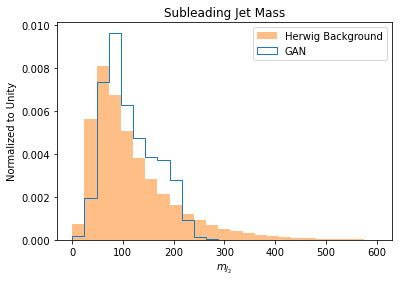

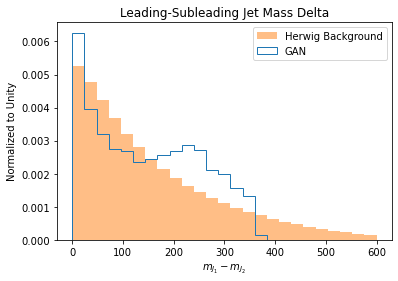

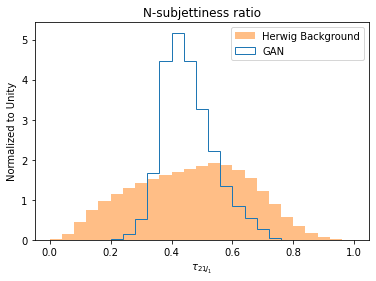

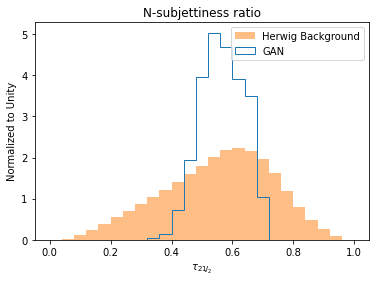

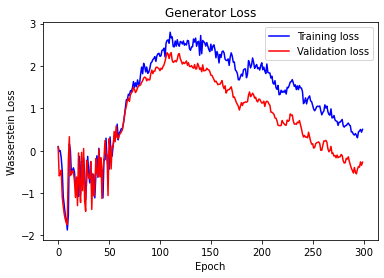

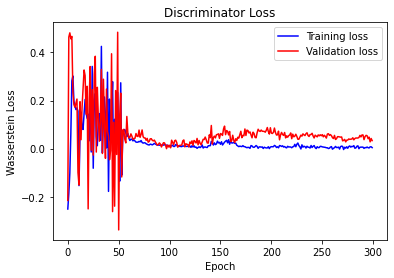

 62%|██████▏   | 310/500 [57:07<35:13, 11.12s/it]
Epoch 310:

Generator training loss: 0.373223387056394
Discriminator training loss: 0.007034845361511028

Generator validation loss: -0.45103087755622434
Discriminator validation loss: 0.04906154996104784
 64%|██████▍   | 319/500 [58:43<32:30, 10.77s/it]
Epoch 320:

Generator training loss: 0.21936347495950242
Discriminator training loss: 0.011651547164880077

Generator validation loss: -0.6429674994872245
Discriminator validation loss: 0.04289698642468625

Epoch 320:


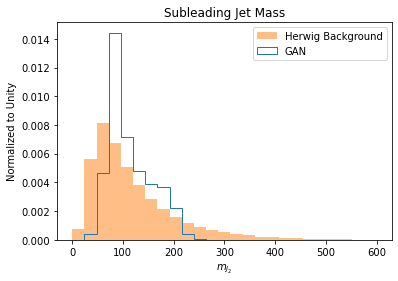

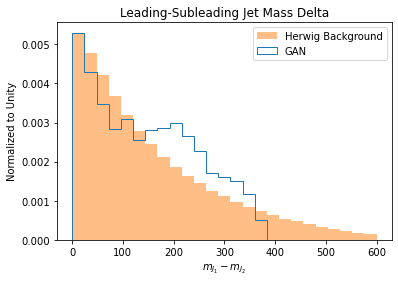

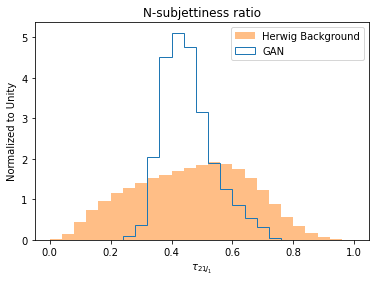

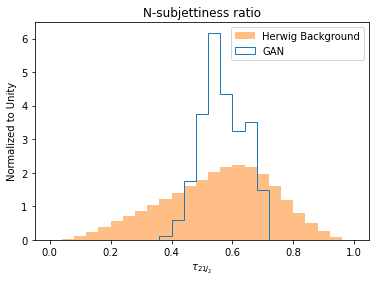

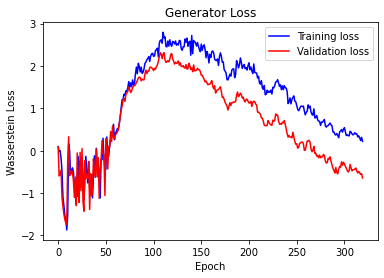

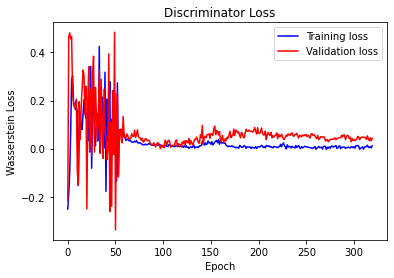

 66%|██████▌   | 330/500 [1:00:43<30:00, 10.59s/it]
Epoch 330:

Generator training loss: 0.2929960926845186
Discriminator training loss: 0.006124769766070948

Generator validation loss: -0.5532322922324555
Discriminator validation loss: 0.04727279477882519
 68%|██████▊   | 339/500 [1:02:19<28:33, 10.64s/it]
Epoch 340:

Generator training loss: 0.421478749129443
Discriminator training loss: 0.003323866339323609

Generator validation loss: -0.4598004307109316
Discriminator validation loss: 0.04418026084236832

Epoch 340:


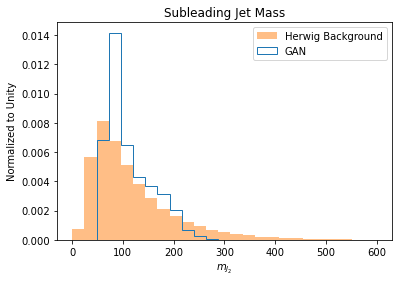

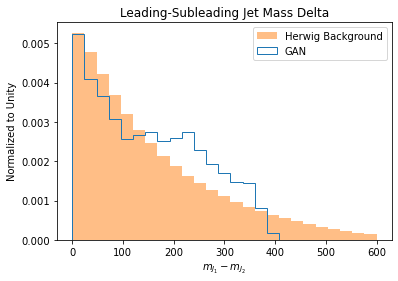

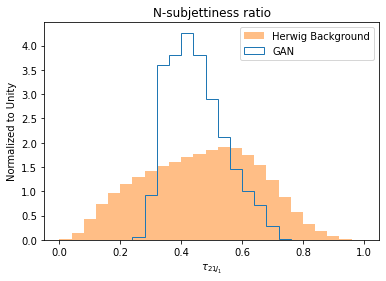

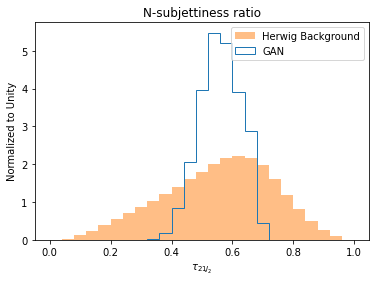

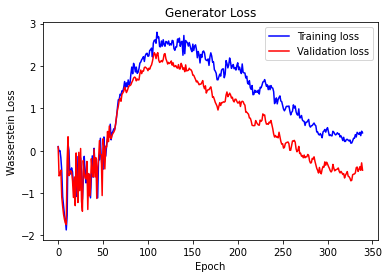

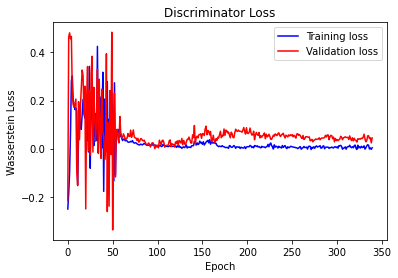

 70%|███████   | 350/500 [1:04:20<27:05, 10.84s/it]
Epoch 350:

Generator training loss: 0.14237330751105526
Discriminator training loss: 0.014552125702731213

Generator validation loss: -0.7064474673911201
Discriminator validation loss: 0.02808234402192421
 72%|███████▏  | 359/500 [1:05:57<25:19, 10.77s/it]
Epoch 360:

Generator training loss: -0.26493124396329015
Discriminator training loss: 0.012244953838355712

Generator validation loss: -1.1545952057740743
Discriminator validation loss: 0.04404734244539597

Epoch 360:


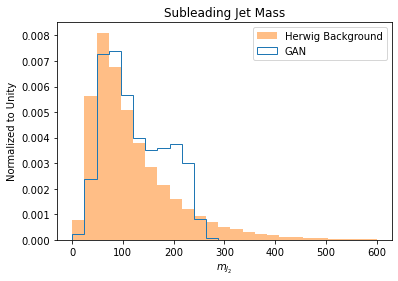

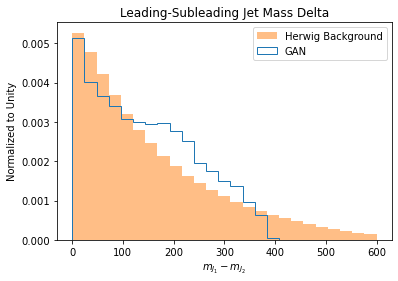

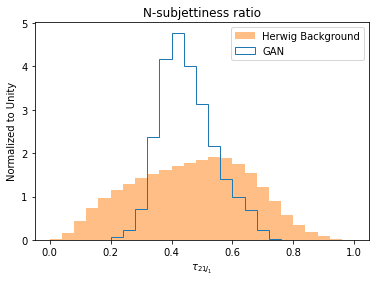

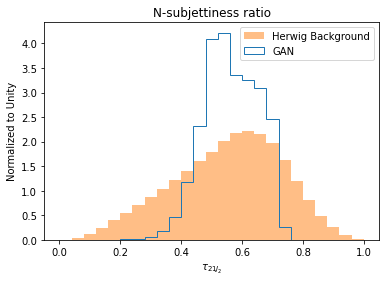

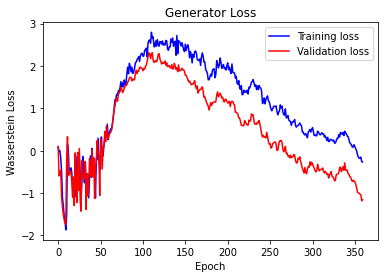

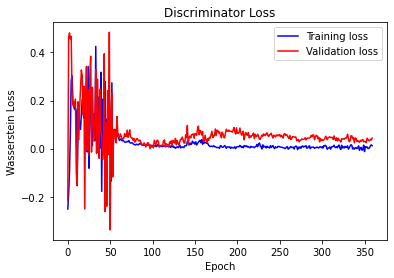

 74%|███████▍  | 370/500 [1:07:58<23:23, 10.79s/it]
Epoch 370:

Generator training loss: -0.09739557442877479
Discriminator training loss: -0.0016797206301995807

Generator validation loss: -0.9241943198760024
Discriminator validation loss: 0.03213071295004871
 76%|███████▌  | 379/500 [1:09:36<21:53, 10.85s/it]
Epoch 380:

Generator training loss: 0.07630125611201133
Discriminator training loss: 0.017557431990185828

Generator validation loss: -0.8285287812840735
Discriminator validation loss: 0.02467012809905952

Epoch 380:


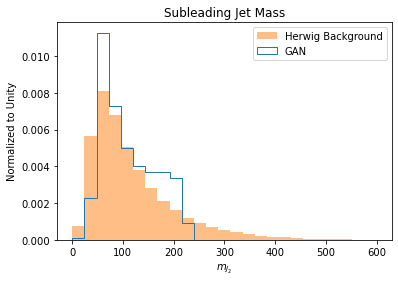

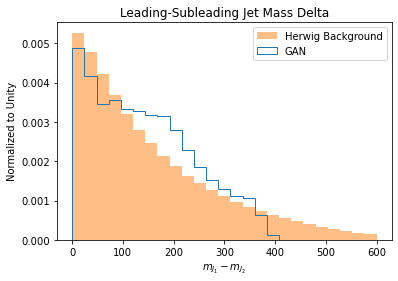

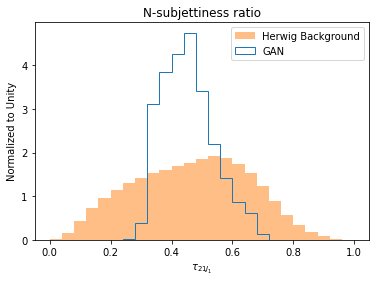

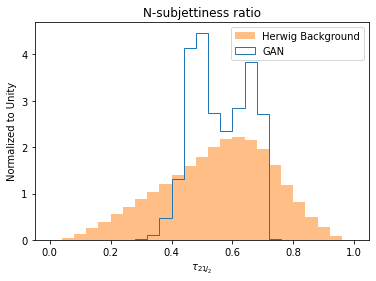

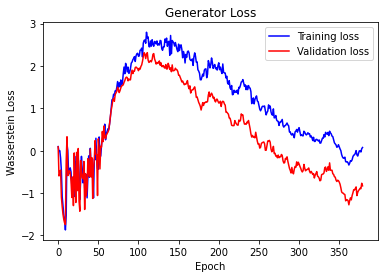

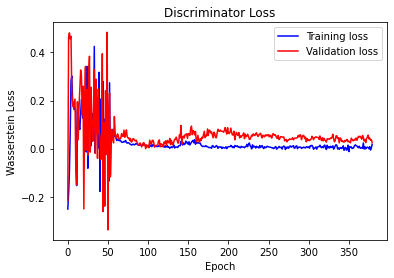

 78%|███████▊  | 390/500 [1:11:36<19:37, 10.70s/it]
Epoch 390:

Generator training loss: 0.11614812451511446
Discriminator training loss: 0.008997847146825054

Generator validation loss: -0.9091743877554533
Discriminator validation loss: 0.05172083433431224
 80%|███████▉  | 399/500 [1:13:14<18:06, 10.76s/it]
Epoch 400:

Generator training loss: 0.048096336303005284
Discriminator training loss: 0.010778638647383036

Generator validation loss: -0.9263807783727764
Discriminator validation loss: 0.047537020609763454

Epoch 400:


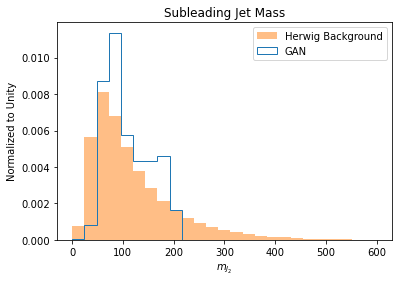

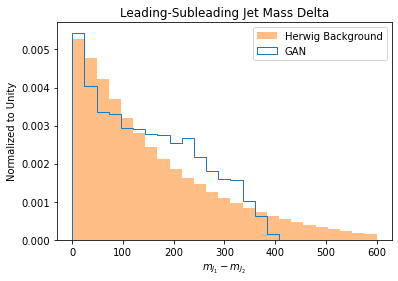

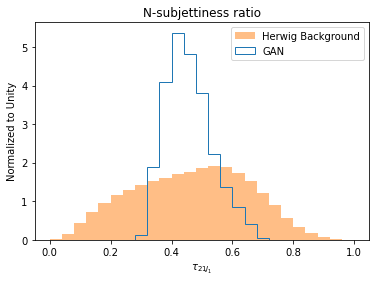

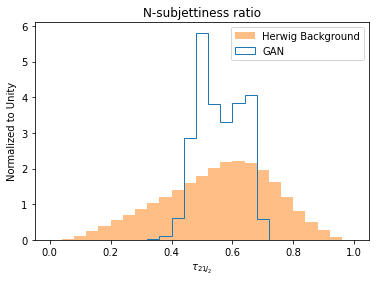

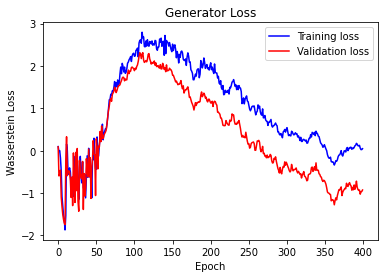

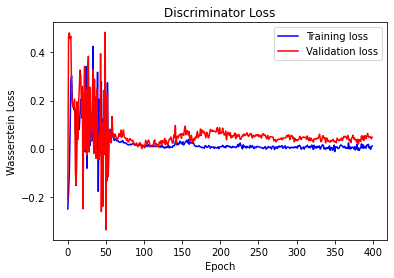

 82%|████████▏ | 410/500 [1:15:18<16:35, 11.06s/it]
Epoch 410:

Generator training loss: 0.21980992578163402
Discriminator training loss: 0.0017934440634210318

Generator validation loss: -0.8214201662139812
Discriminator validation loss: 0.0565349171491585
 84%|████████▍ | 419/500 [1:16:56<14:38, 10.85s/it]
Epoch 420:

Generator training loss: 0.1586765519014428
Discriminator training loss: 0.008732663618104958

Generator validation loss: -0.8309002494225732
Discriminator validation loss: 0.04081349410345682

Epoch 420:


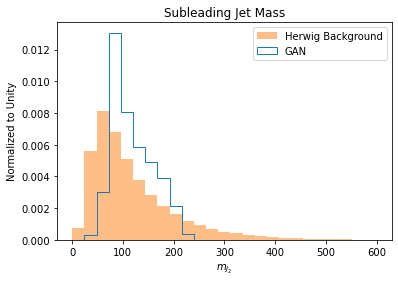

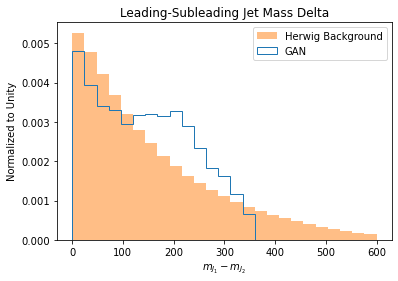

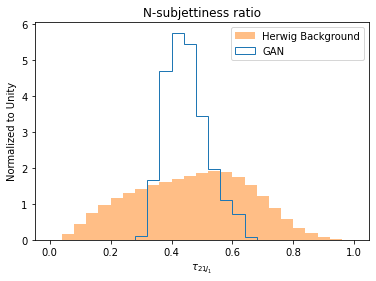

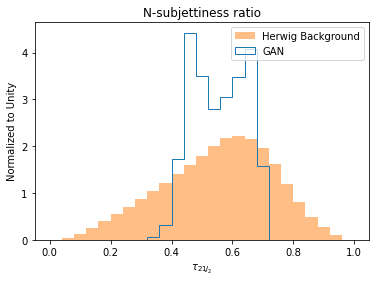

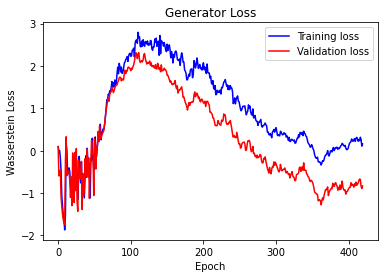

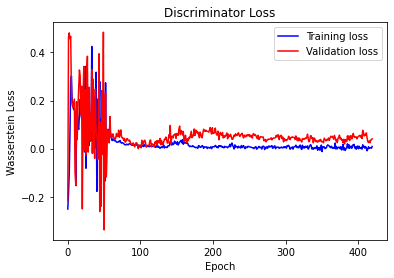

 86%|████████▌ | 430/500 [1:18:58<12:48, 10.98s/it]
Epoch 430:

Generator training loss: 0.19194959598921674
Discriminator training loss: 0.0019767855829925045

Generator validation loss: -0.864977707872625
Discriminator validation loss: 0.039378714657791275
 88%|████████▊ | 439/500 [1:20:36<10:59, 10.80s/it]
Epoch 440:

Generator training loss: 0.33518355969076286
Discriminator training loss: 0.0068091291550892346

Generator validation loss: -0.7753790814246319
Discriminator validation loss: 0.06152074616669571

Epoch 440:


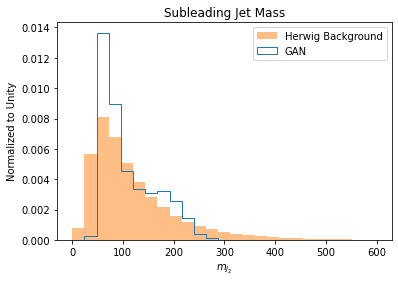

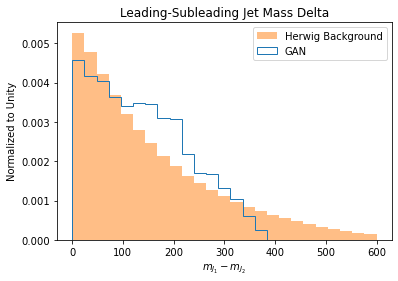

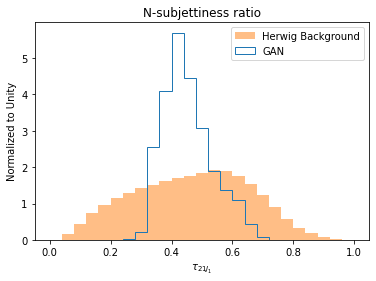

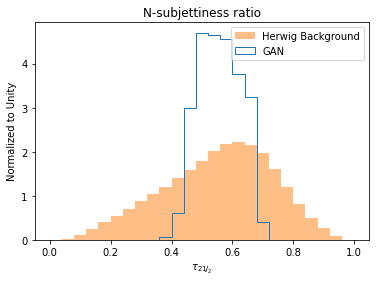

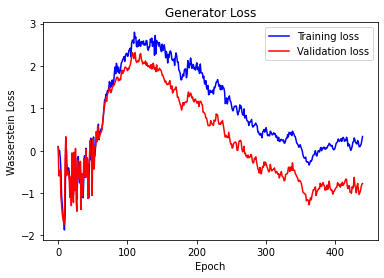

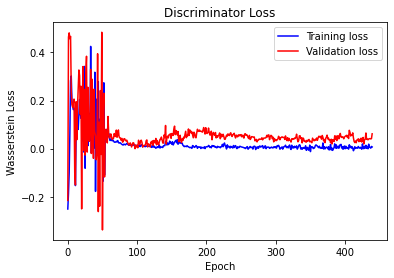

 90%|█████████ | 450/500 [1:22:38<09:03, 10.87s/it]
Epoch 450:

Generator training loss: 0.5779935656906788
Discriminator training loss: -0.0012897197935334047

Generator validation loss: -0.5714300537451366
Discriminator validation loss: 0.05360230696616606
 92%|█████████▏| 459/500 [1:24:15<07:26, 10.89s/it]
Epoch 460:

Generator training loss: 0.43424306878542673
Discriminator training loss: 0.0017878668920692613

Generator validation loss: -0.722701121549138
Discriminator validation loss: 0.04204871549393189

Epoch 460:


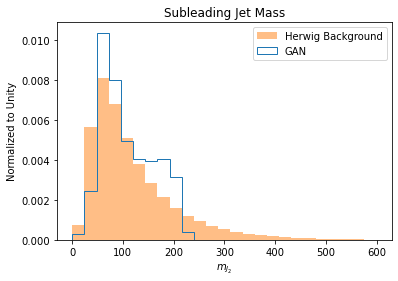

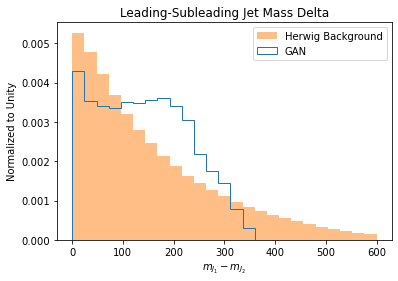

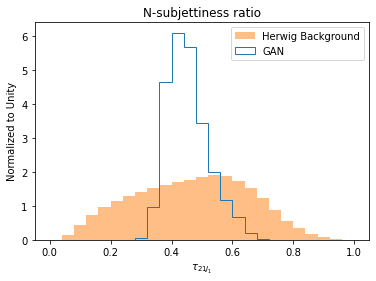

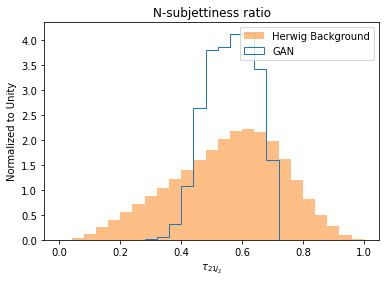

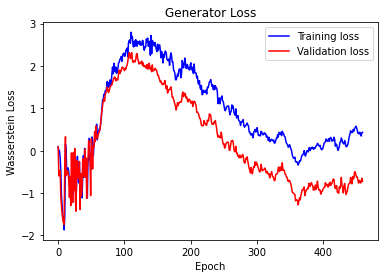

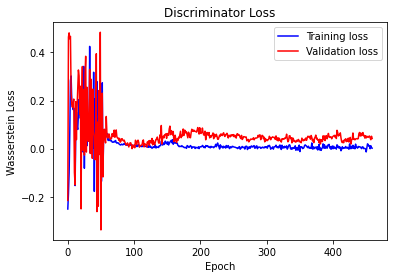

 94%|█████████▍| 470/500 [1:26:19<05:26, 10.88s/it]
Epoch 470:

Generator training loss: 0.40116551220213453
Discriminator training loss: 0.003368439521860555

Generator validation loss: -0.7633493466943986
Discriminator validation loss: 0.041046095181821445
 96%|█████████▌| 479/500 [1:27:57<03:46, 10.80s/it]
Epoch 480:

Generator training loss: 0.6432302817422387
Discriminator training loss: -8.99290094085829e-05

Generator validation loss: -0.4831077261049245
Discriminator validation loss: 0.05384454519495553

Epoch 480:


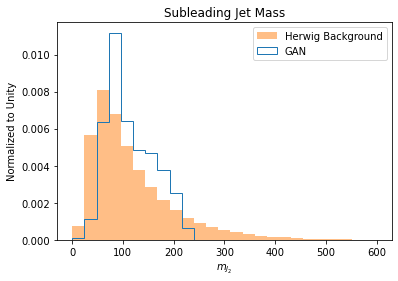

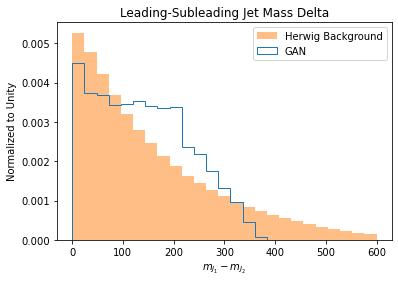

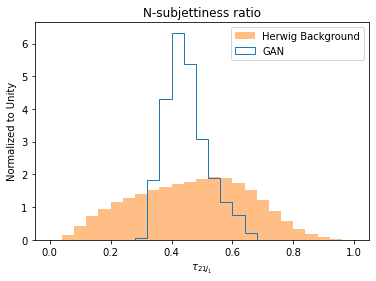

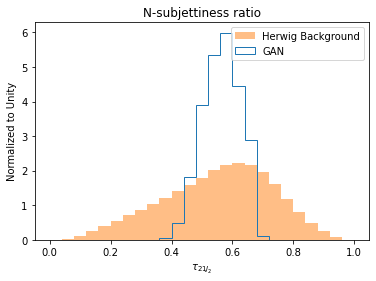

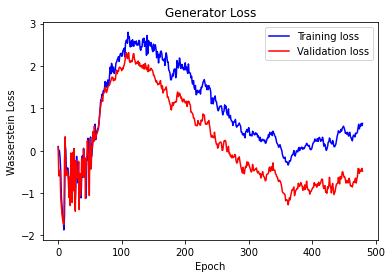

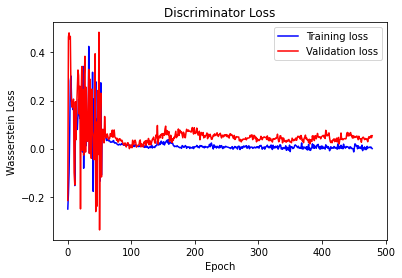

 98%|█████████▊| 490/500 [1:29:59<01:47, 10.77s/it]
Epoch 490:

Generator training loss: 0.9131637330630116
Discriminator training loss: 0.01590291208054633

Generator validation loss: -0.17347440048746884
Discriminator validation loss: 0.040283511492965725
100%|█████████▉| 499/500 [1:31:37<00:10, 10.89s/it]
Epoch 500:

Generator training loss: 1.1849507905257857
Discriminator training loss: -0.000611071535771423

Generator validation loss: 0.1771546485452135
Discriminator validation loss: 0.043371698996586536

Epoch 500:


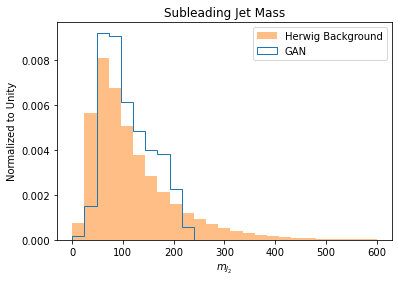

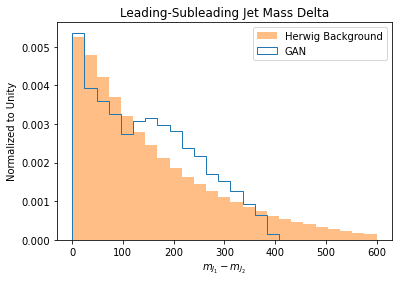

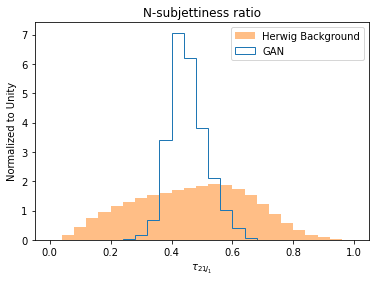

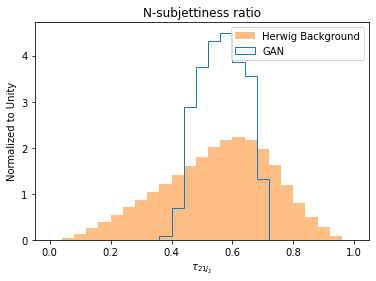

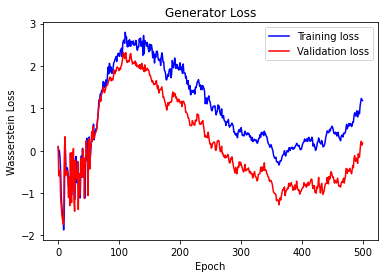

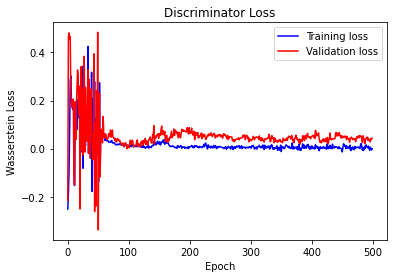

100%|██████████| 500/500 [1:31:50<00:00, 11.02s/it]


In [28]:
train(train_dataset, test_dataset, EPOCHS, N_CRITIC)

## Results
???